# Analysis of total crimes in India districtwise

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
pd.set_option('display.max_columns', 500)

In [3]:
india_crime = pd.read_csv('01_District_wise_crimes_committed_IPC_2001_2012.csv')
india_crime.head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,DACOITY,PREPARATION AND ASSEMBLY FOR DACOITY,ROBBERY,BURGLARY,THEFT,AUTO THEFT,OTHER THEFT,RIOTS,CRIMINAL BREACH OF TRUST,CHEATING,COUNTERFIETING,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,30,16,9,0,41,198,199,22,177,78,16,104,1,30,1131,16,149,34,175,0,181,1518,4154
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,30,23,8,0,16,191,366,57,309,168,11,65,8,69,1543,7,118,24,154,0,270,754,4125
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,34,25,4,0,14,237,723,164,559,156,33,209,9,38,2088,14,112,83,186,0,404,1262,5818
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,20,5,1,0,4,98,173,36,137,164,12,37,2,23,795,17,126,38,57,0,233,1181,3140
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,26,23,4,0,25,437,1021,150,871,70,50,220,3,41,1244,12,109,58,247,0,431,2313,6507


In [4]:
india_crime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9017 entries, 0 to 9016
Data columns (total 33 columns):
 #   Column                                               Non-Null Count  Dtype 
---  ------                                               --------------  ----- 
 0   STATE/UT                                             9017 non-null   object
 1   DISTRICT                                             9017 non-null   object
 2   YEAR                                                 9017 non-null   int64 
 3   MURDER                                               9017 non-null   int64 
 4   ATTEMPT TO MURDER                                    9017 non-null   int64 
 5   CULPABLE HOMICIDE NOT AMOUNTING TO MURDER            9017 non-null   int64 
 6   RAPE                                                 9017 non-null   int64 
 7   CUSTODIAL RAPE                                       9017 non-null   int64 
 8   OTHER RAPE                                           9017 non-null   int64 
 9

In [5]:
india_crime.isnull().sum()

STATE/UT                                               0
DISTRICT                                               0
YEAR                                                   0
MURDER                                                 0
ATTEMPT TO MURDER                                      0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER              0
RAPE                                                   0
CUSTODIAL RAPE                                         0
OTHER RAPE                                             0
KIDNAPPING & ABDUCTION                                 0
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS            0
KIDNAPPING AND ABDUCTION OF OTHERS                     0
DACOITY                                                0
PREPARATION AND ASSEMBLY FOR DACOITY                   0
ROBBERY                                                0
BURGLARY                                               0
THEFT                                                  0
AUTO THEFT                     

In [6]:
india_crime['STATE/UT'].nunique()

35

In [7]:
india_crime['DISTRICT'].nunique()

808

In [8]:
waste_rows = india_crime[(india_crime['DISTRICT']=='TOTAL') | (india_crime['DISTRICT']=='DELHI UT TOTAL')].index
waste_rows

Int64Index([  28,   42,   70,  115,  135,  138,  169,  190,  204,  228,
            ...
            8938, 8952, 8982, 8986, 8988, 8990, 8993, 8997, 9013, 9016],
           dtype='int64', length=420)

In [9]:
india_crime.drop(waste_rows,inplace=True)

In [10]:
india_crime.head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,DACOITY,PREPARATION AND ASSEMBLY FOR DACOITY,ROBBERY,BURGLARY,THEFT,AUTO THEFT,OTHER THEFT,RIOTS,CRIMINAL BREACH OF TRUST,CHEATING,COUNTERFIETING,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,30,16,9,0,41,198,199,22,177,78,16,104,1,30,1131,16,149,34,175,0,181,1518,4154
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,30,23,8,0,16,191,366,57,309,168,11,65,8,69,1543,7,118,24,154,0,270,754,4125
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,34,25,4,0,14,237,723,164,559,156,33,209,9,38,2088,14,112,83,186,0,404,1262,5818
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,20,5,1,0,4,98,173,36,137,164,12,37,2,23,795,17,126,38,57,0,233,1181,3140
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,26,23,4,0,25,437,1021,150,871,70,50,220,3,41,1244,12,109,58,247,0,431,2313,6507


In [11]:
## State-wise total crimes
india_crime.groupby('STATE/UT')['TOTAL IPC CRIMES'].sum().sort_values(ascending=False).reset_index(name ='Total Crimes')

,STATE/UT,Total Crimes
0,MADHYA PRADESH,2413770
1,MAHARASHTRA,2273436
2,TAMIL NADU,2060176
3,ANDHRA PRADESH,2018981
4,UTTAR PRADESH,1858074
5,RAJASTHAN,1855916
6,KARNATAKA,1481063
7,KERALA,1437459
8,GUJARAT,1385775
9,BIHAR,1346293


In [12]:
#Top 10 cities with highest crime rates
india_crime.groupby('STATE/UT')['TOTAL IPC CRIMES'].sum().sort_values(ascending=False).reset_index(name ='Total Crimes')[:10]

,STATE/UT,Total Crimes
0,MADHYA PRADESH,2413770
1,MAHARASHTRA,2273436
2,TAMIL NADU,2060176
3,ANDHRA PRADESH,2018981
4,UTTAR PRADESH,1858074
5,RAJASTHAN,1855916
6,KARNATAKA,1481063
7,KERALA,1437459
8,GUJARAT,1385775
9,BIHAR,1346293


In [13]:
crimes_ywise = india_crime.groupby(['STATE/UT','YEAR'])['TOTAL IPC CRIMES'].sum().reset_index(name ='Total Crimes Yearwise')
crimes_ywise.head()

,STATE/UT,YEAR,Total Crimes Yearwise
0,A & N ISLANDS,2001,658
1,A & N ISLANDS,2002,608
2,A & N ISLANDS,2003,644
3,A & N ISLANDS,2004,748
4,A & N ISLANDS,2005,682


In [14]:
crimes_ywise['STATE/UT'].unique()

array(['A & N ISLANDS', 'ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM',
       'BIHAR', 'CHANDIGARH', 'CHHATTISGARH', 'D & N HAVELI',
       'DAMAN & DIU', 'DELHI UT', 'GOA', 'GUJARAT', 'HARYANA',
       'HIMACHAL PRADESH', 'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA',
       'KERALA', 'LAKSHADWEEP', 'MADHYA PRADESH', 'MAHARASHTRA',
       'MANIPUR', 'MEGHALAYA', 'MIZORAM', 'NAGALAND', 'ODISHA',
       'PUDUCHERRY', 'PUNJAB', 'RAJASTHAN', 'SIKKIM', 'TAMIL NADU',
       'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND', 'WEST BENGAL'],
      dtype=object)

In [15]:
state_ut = ['A & N ISLANDS', 'ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM',
       'BIHAR', 'CHANDIGARH', 'CHHATTISGARH', 'D & N HAVELI',
       'DAMAN & DIU', 'DELHI UT', 'GOA', 'GUJARAT', 'HARYANA',
       'HIMACHAL PRADESH', 'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA',
       'KERALA', 'LAKSHADWEEP', 'MADHYA PRADESH', 'MAHARASHTRA',
       'MANIPUR', 'MEGHALAYA', 'MIZORAM', 'NAGALAND', 'ODISHA',
       'PUDUCHERRY', 'PUNJAB', 'RAJASTHAN', 'SIKKIM', 'TAMIL NADU',
       'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND', 'WEST BENGAL']

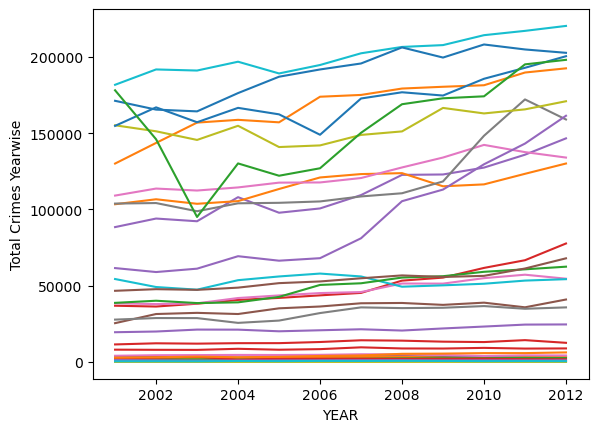

In [16]:
for i in state_ut:
    temp_df = crimes_ywise[crimes_ywise['STATE/UT']==i]
    sns.lineplot(x='YEAR',y='Total Crimes Yearwise',data=temp_df)

<Axes: xlabel='YEAR', ylabel='Total Crimes Yearwise'>

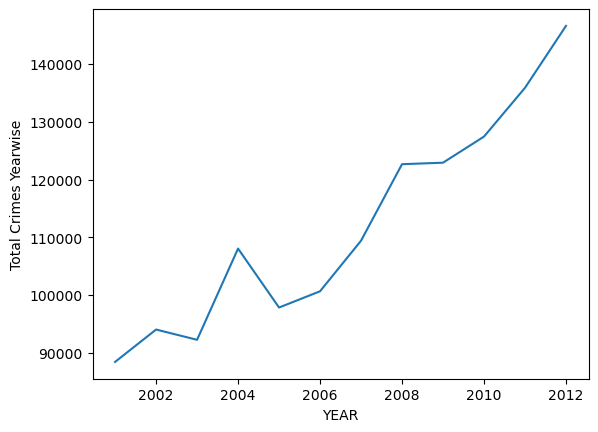

In [17]:
temp_df = crimes_ywise[crimes_ywise['STATE/UT']=='BIHAR']
sns.lineplot(x='YEAR',y='Total Crimes Yearwise',data=temp_df)

C:\Users\bhanu\AppData\Local\Temp\ipykernel_16324\3383369587.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1, figsize=(8, 4))


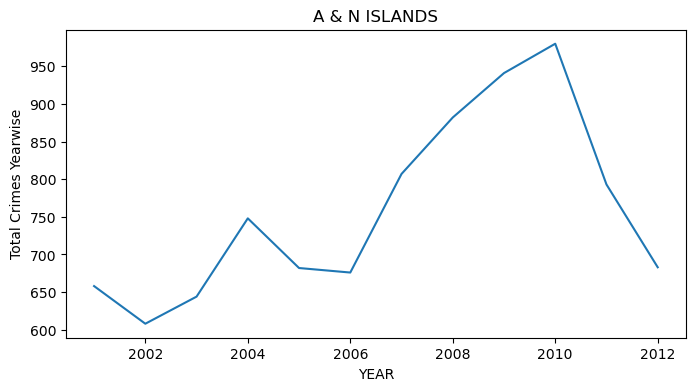

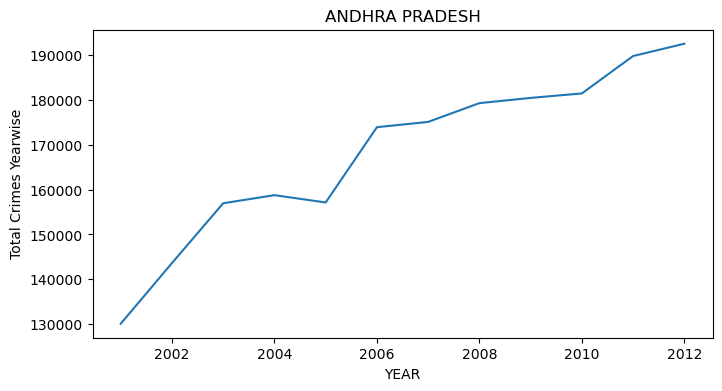

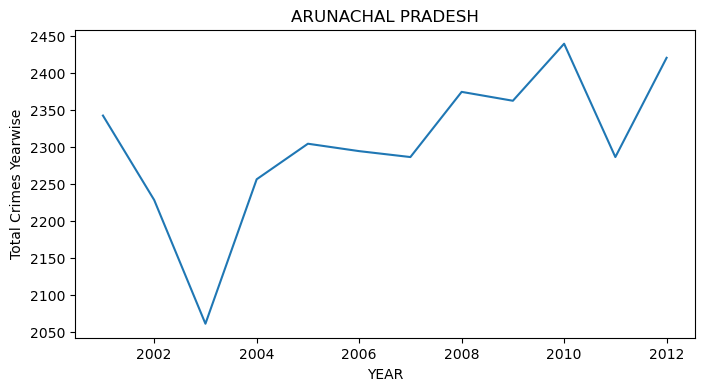

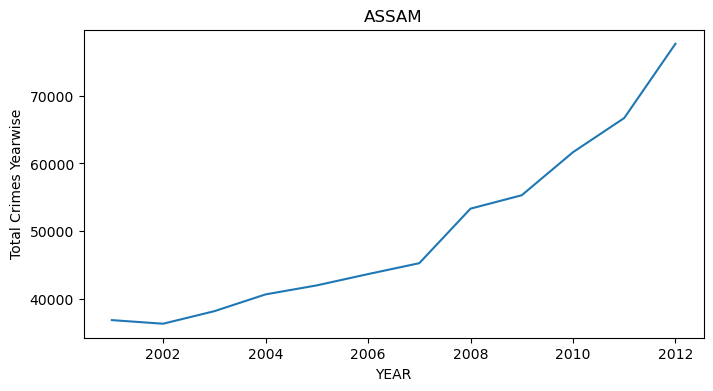

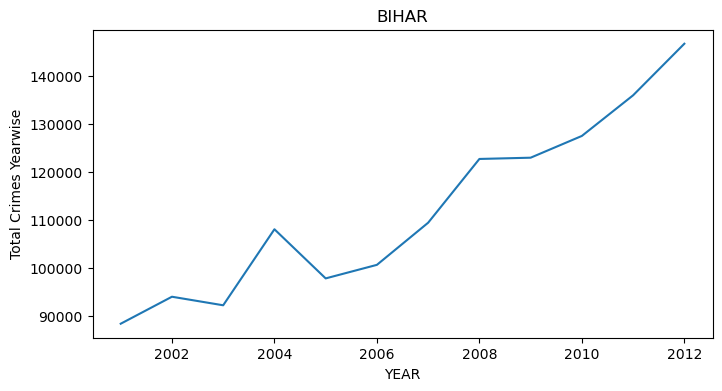

...

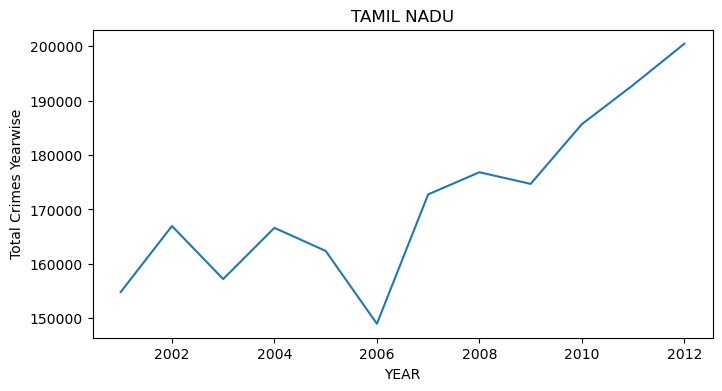

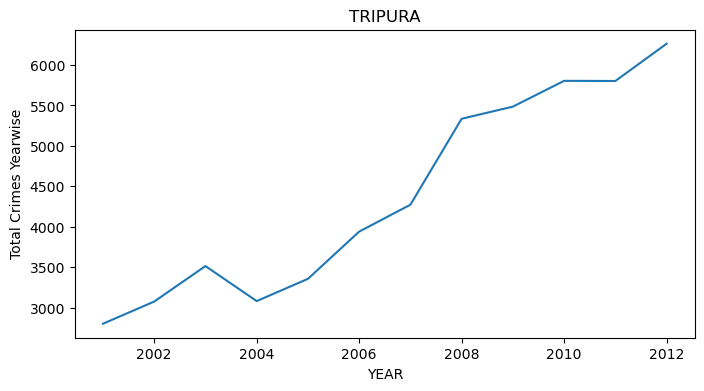

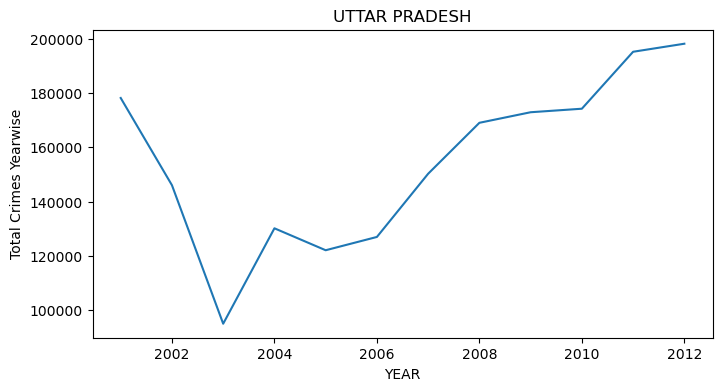

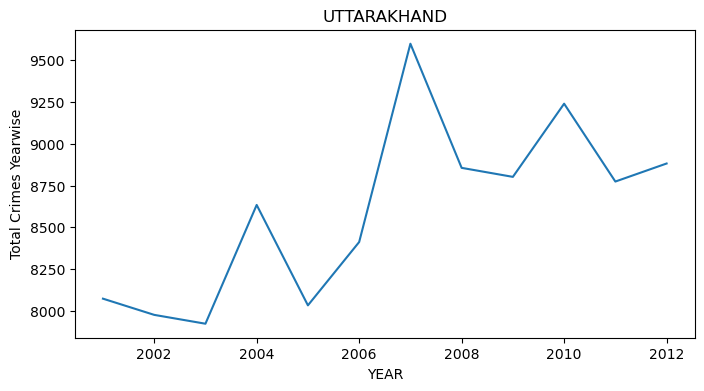

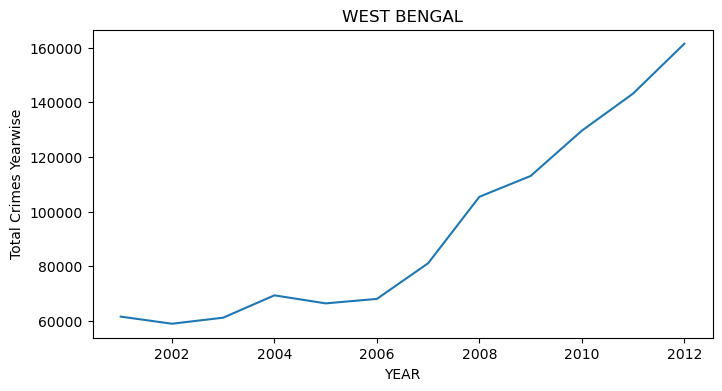

In [18]:
for i in state_ut:
    fig, ax = plt.subplots(1,1, figsize=(8, 4))
    temp_df = crimes_ywise[crimes_ywise['STATE/UT']==i]
    sns.lineplot(x='YEAR',y='Total Crimes Yearwise',data=temp_df)
    plt.title(i)

In [19]:
## Districtwise crime rate
india_crime.groupby(['DISTRICT','YEAR'])['TOTAL IPC CRIMES'].sum().sort_values(ascending=False).reset_index(name='Total Crimes yearwise')

,DISTRICT,YEAR,Total Crimes yearwise
0,ERNAKULAM RURAL,2011,34638
1,MUMBAI COMMR.,2010,33932
2,MUMBAI COMMR.,2008,32770
3,MUMBAI COMMR.,2011,32647
4,BANGALORE COMMR.,2009,32380
...,...,...,...
8402,CID,2009,3
8403,RAILWAYS KATRA,2012,2
8404,CID,2008,2
8405,S.T.F.,2002,0


In [20]:
## Top 20 Districts with highest crime rate
top_20_districts_crime=india_crime.groupby('DISTRICT')['TOTAL IPC CRIMES'].sum().sort_values(ascending=False).reset_index(name ='Total Crimes Dwise')[:20]
top_20_districts_crime

,DISTRICT,Total Crimes Dwise
0,BANGALORE COMMR.,350347
1,MUMBAI COMMR.,222670
2,AHMEDABAD COMMR.,218005
3,INDORE,204398
4,HYDERABAD CITY,202931
5,BHOPAL,169575
6,CHENNAI,164467
7,KOLKATA,158429
8,PATNA,147542
9,MUMBAI,141815


In [33]:
t20_crimes_dis_ywise=india_crime[india_crime['DISTRICT'].isin(top_20_districts_crime['DISTRICT'])]
t20_crimes_dis_ywise

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,DACOITY,PREPARATION AND ASSEMBLY FOR DACOITY,ROBBERY,BURGLARY,THEFT,AUTO THEFT,OTHER THEFT,RIOTS,CRIMINAL BREACH OF TRUST,CHEATING,COUNTERFIETING,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
7,ANDHRA PRADESH,HYDERABAD CITY,2001,111,113,7,37,0,37,80,39,41,13,0,67,1155,2792,1128,1664,65,101,1293,24,0,3137,24,118,27,746,0,409,1512,11831
102,BIHAR,PATNA,2001,434,581,30,27,0,27,197,11,186,91,31,414,426,1568,399,1169,506,196,331,12,54,354,90,47,0,152,39,178,2825,8583
139,GUJARAT,AHMEDABAD COMMR.,2001,90,58,60,39,0,39,143,117,26,18,4,192,695,3588,1740,1848,191,140,205,13,2,1311,7,54,27,530,0,0,6129,13496
255,KARNATAKA,BANGALORE COMMR.,2001,221,327,5,40,0,40,152,56,96,31,25,284,2108,6293,2401,3892,298,258,1708,79,3,3735,40,223,51,229,0,38,11106,27254
307,MADHYA PRADESH,BHOPAL,2001,61,109,0,106,0,106,55,48,7,8,6,99,852,1351,425,926,77,33,192,0,8,652,15,252,56,132,0,272,9372,13708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8953,WEST BENGAL,24 PARGANAS NORTH,2012,140,108,80,118,0,118,497,338,159,34,40,61,6,1453,381,1072,680,94,141,9,19,79,74,196,1,1860,3,10,6062,11765
8954,WEST BENGAL,24 PARGANAS SOUTH,2012,224,8,28,244,0,244,419,419,0,34,58,35,51,1279,194,1085,1976,4,250,6,15,234,45,83,0,1666,0,70,7641,14370
8971,WEST BENGAL,KOLKATA,2012,85,154,29,68,0,68,271,210,61,8,20,44,96,4960,659,4301,397,428,2100,26,0,3518,19,486,377,865,9,507,10903,25370
8985,A & N ISLANDS,SOUTH,2012,8,3,0,8,0,8,7,6,1,4,0,1,65,54,0,54,8,5,26,1,4,50,2,14,3,3,0,5,273,544


In [22]:
# District wise yearly crimes for top 5 districts
top_20_districts_crime['DISTRICT'].head().values

array(['BANGALORE COMMR.', 'MUMBAI COMMR.', 'AHMEDABAD COMMR.', 'INDORE',
       'HYDERABAD CITY'], dtype=object)

In [25]:
crime_districts_5 = ['BANGALORE COMMR.', 'MUMBAI COMMR.', 'AHMEDABAD COMMR.', 'INDORE',
       'HYDERABAD CITY']

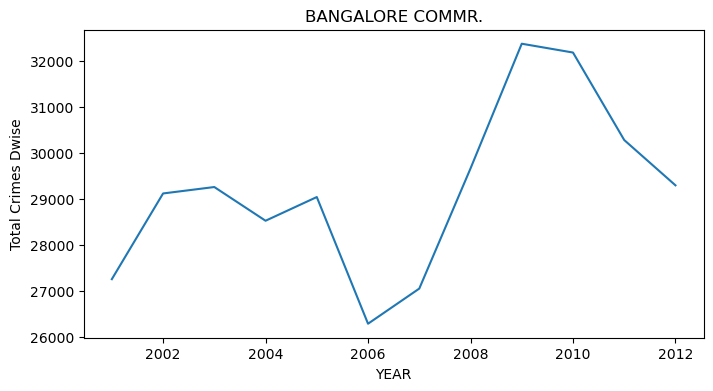

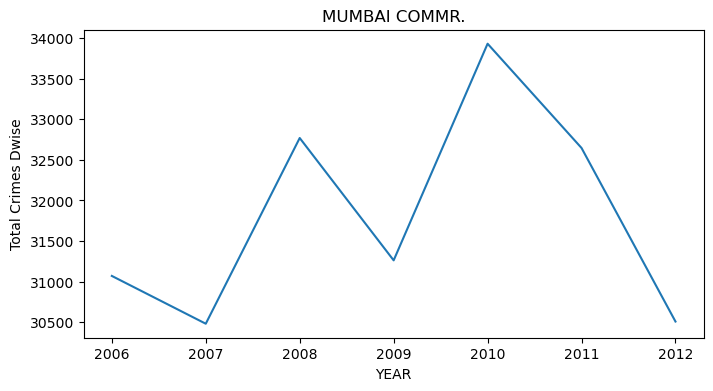

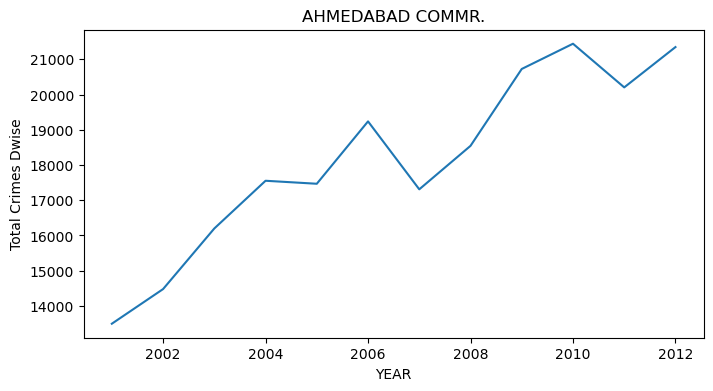

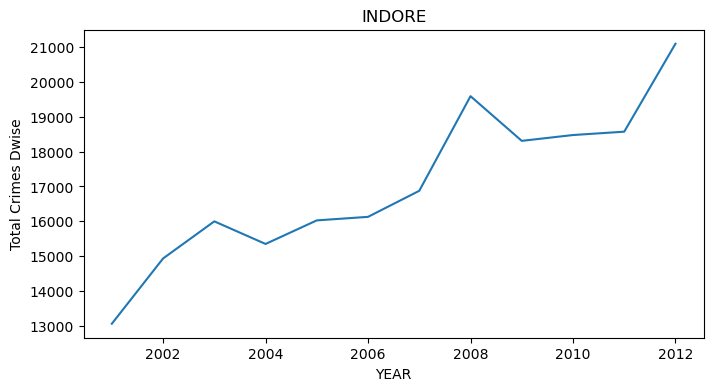

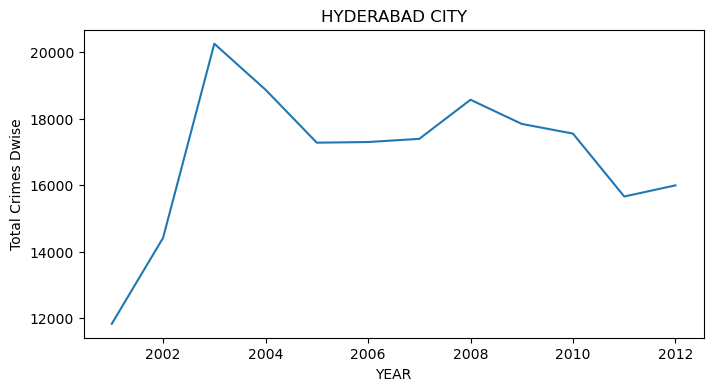

In [42]:
for i in crime_districts_5:
    fig, ax = plt.subplots(1,1, figsize=(8, 4))
    temp_df = t20_crimes_dis_ywise[t20_crimes_dis_ywise['DISTRICT']==i]
    temp_df1 = temp_df.groupby(['DISTRICT','YEAR'])['TOTAL IPC CRIMES'].sum().sort_values(ascending=False).reset_index(name ='Total Crimes Dwise')
    sns.lineplot(x='YEAR',y='Total Crimes Dwise',data=temp_df1)
    plt.title(i)



## ANALYZING THE DIFFERENT CRIMES STATEWISE

In [52]:
## Murders in different states over the years
murders_ywise = india_crime.groupby(['STATE/UT', "YEAR"])['MURDER'].sum().sort_values(ascending=False).reset_index(name ='Total Murders Ywise')
murders_ywise

,STATE/UT,YEAR,Total Murders Ywise
0,UTTAR PRADESH,2001,7601
1,UTTAR PRADESH,2002,6825
2,UTTAR PRADESH,2004,6126
3,UTTAR PRADESH,2005,5711
4,UTTAR PRADESH,2006,5480
...,...,...,...
415,LAKSHADWEEP,2010,0
416,LAKSHADWEEP,2012,0
417,LAKSHADWEEP,2002,0
418,LAKSHADWEEP,2004,0


C:\Users\bhanu\AppData\Local\Temp\ipykernel_16324\3126834121.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1, figsize=(8, 4))


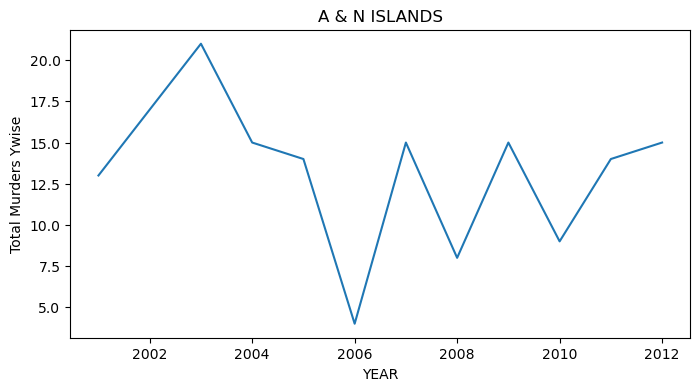

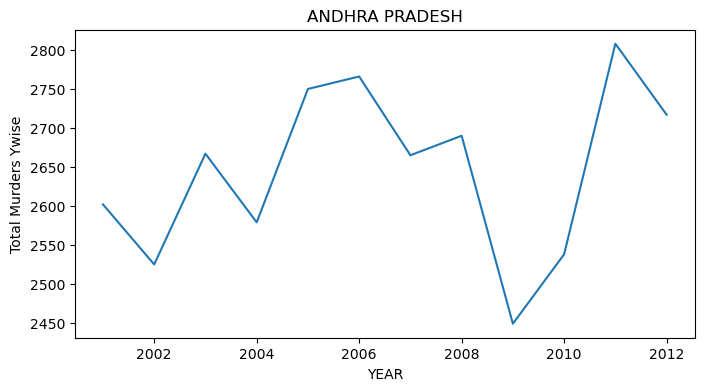

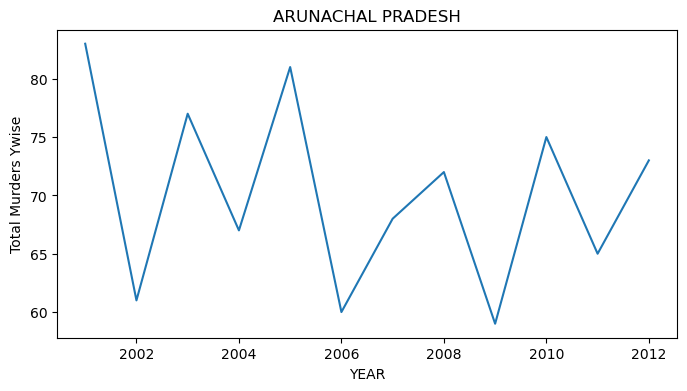

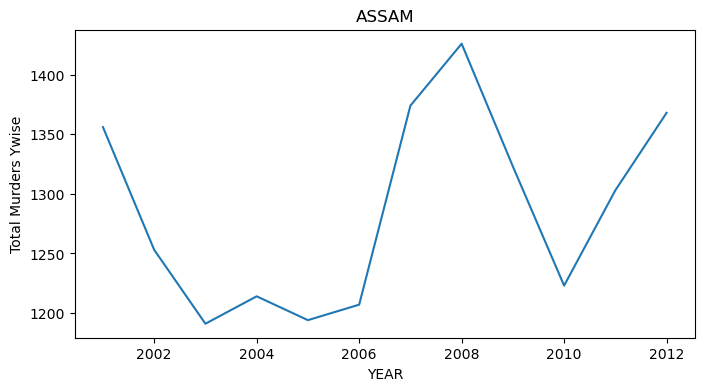

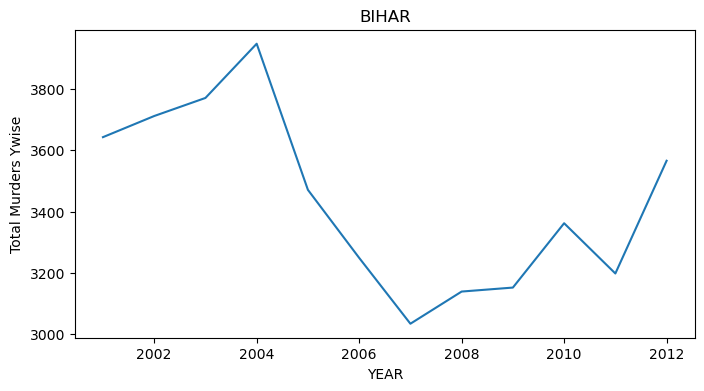

...

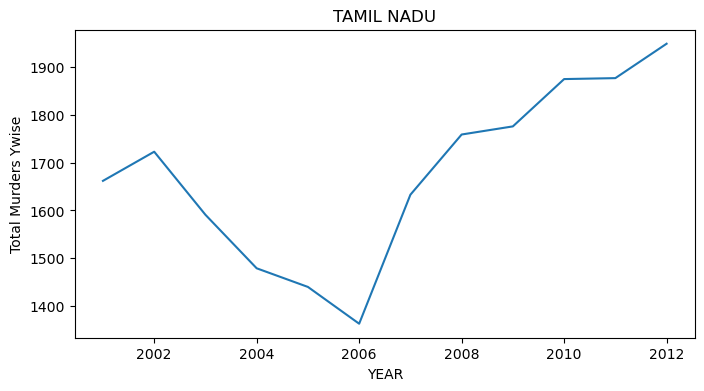

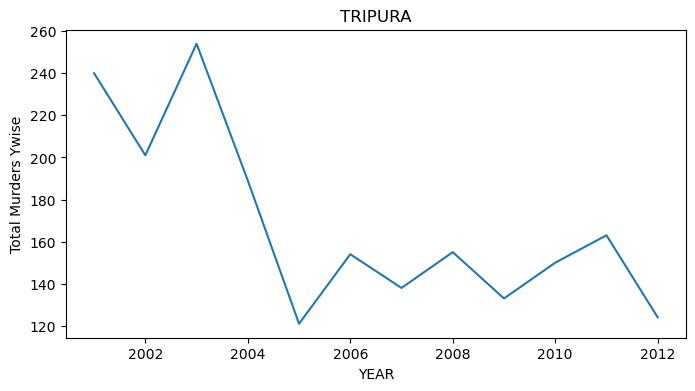

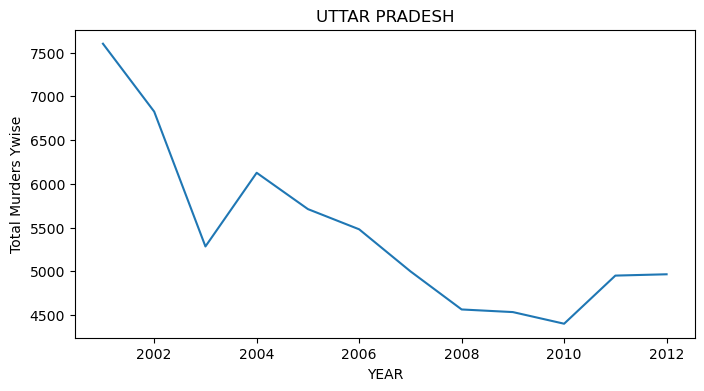

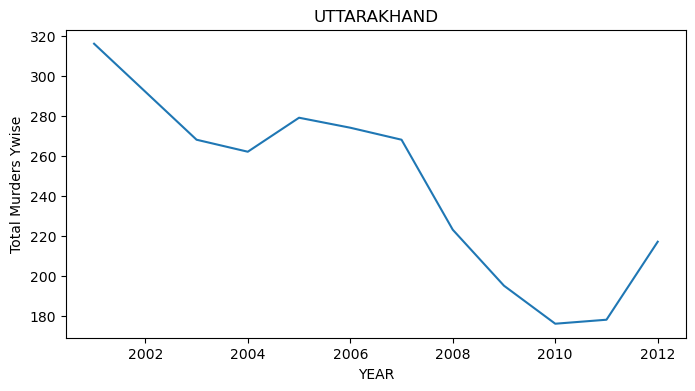

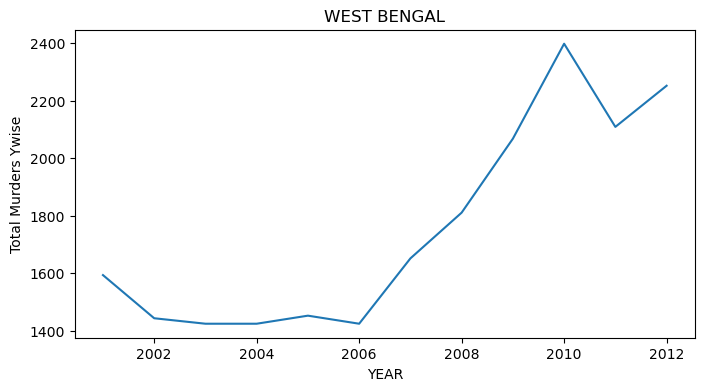

In [64]:
for i in state_ut:
    fig, ax = plt.subplots(1,1, figsize=(8, 4))
    temp_df = murders_ywise[murders_ywise['STATE/UT']==i]
    temp_df1 = temp_df.groupby(['STATE/UT','YEAR'])['Total Murders Ywise'].sum().sort_values(ascending=False).reset_index(name ='Total Murders Ywise')
    sns.lineplot(x='YEAR',y='Total Murders Ywise',data=temp_df1)

    plt.title(i)

In [65]:
## Rapes in different states over the years
rapes_ywise = india_crime.groupby(['STATE/UT', "YEAR"])['RAPE'].sum().sort_values(ascending=False).reset_index(name ='Total Rapes Ywise')
rapes_ywise

,STATE/UT,YEAR,Total Rapes Ywise
0,MADHYA PRADESH,2012,3425
1,MADHYA PRADESH,2011,3406
2,MADHYA PRADESH,2010,3135
3,MADHYA PRADESH,2007,3010
4,MADHYA PRADESH,2009,2998
...,...,...,...
415,LAKSHADWEEP,2001,0
416,LAKSHADWEEP,2012,0
417,DAMAN & DIU,2002,0
418,DAMAN & DIU,2001,0


C:\Users\bhanu\AppData\Local\Temp\ipykernel_16324\20899468.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1, figsize=(8, 4))


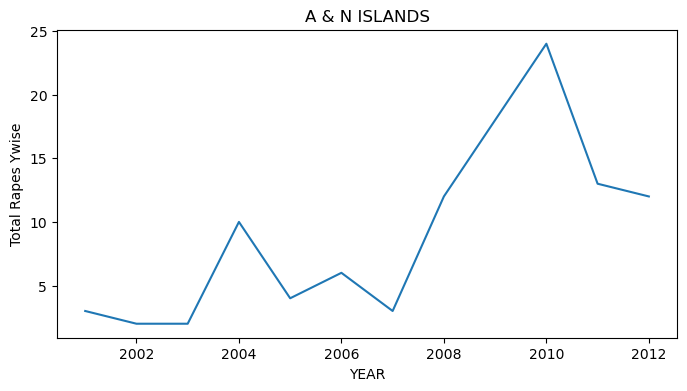

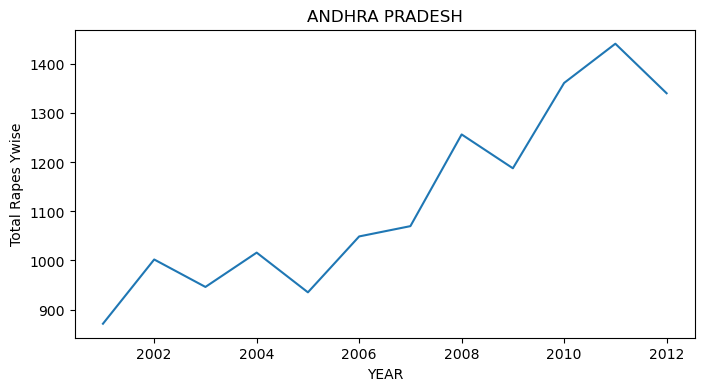

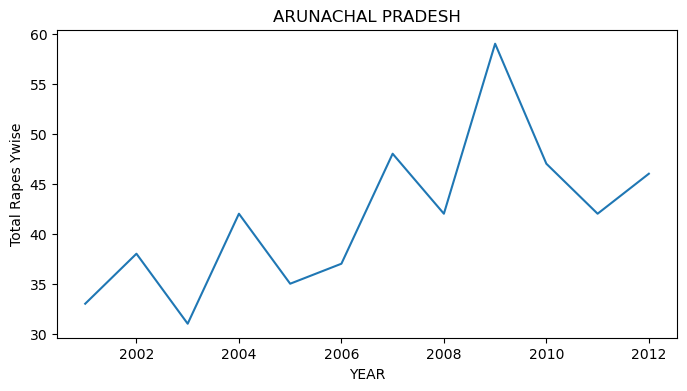

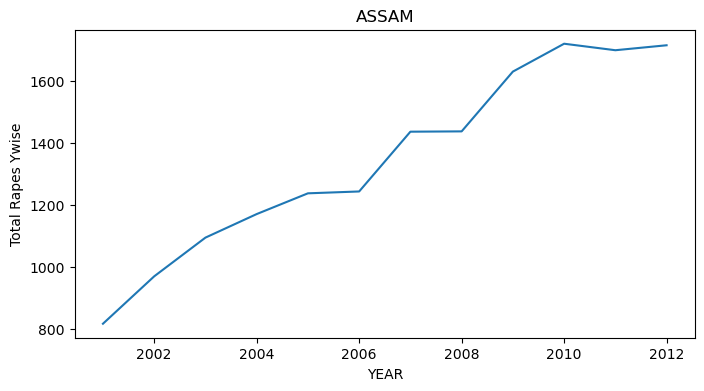

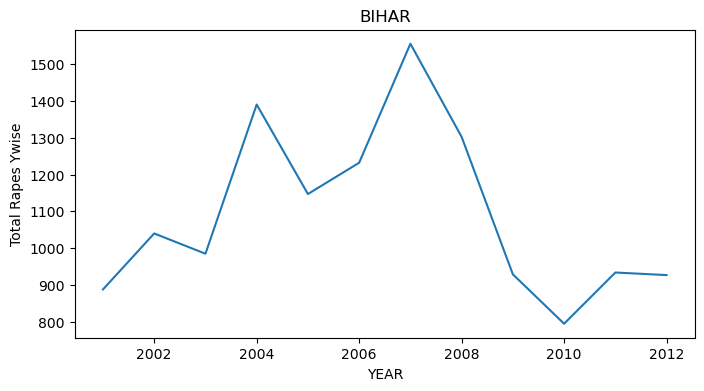

...

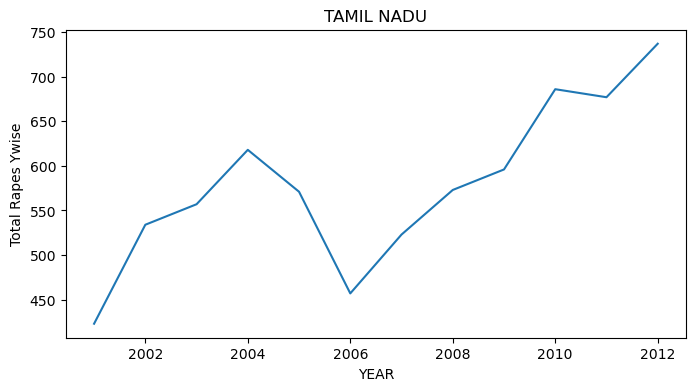

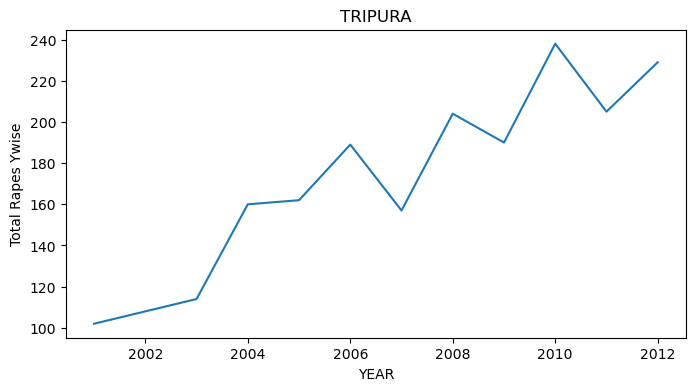

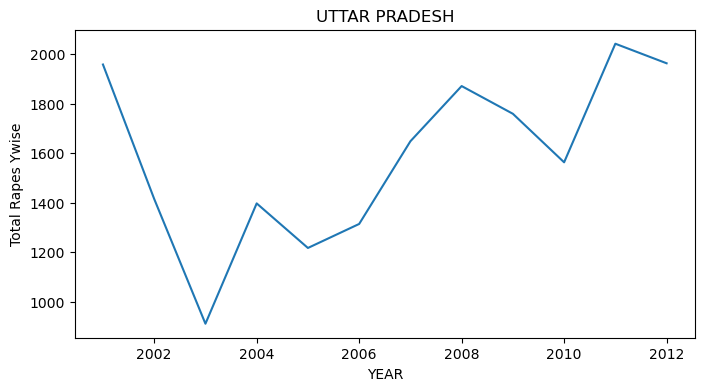

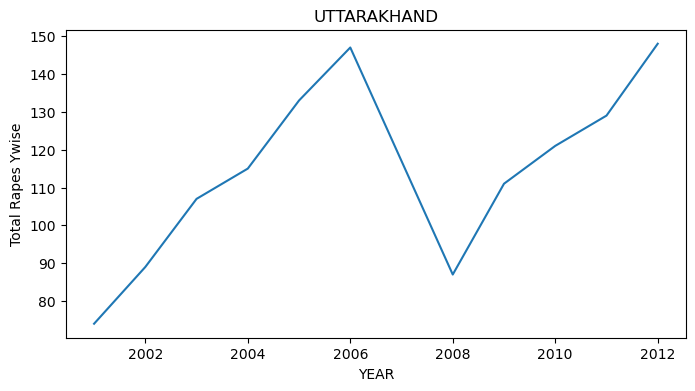

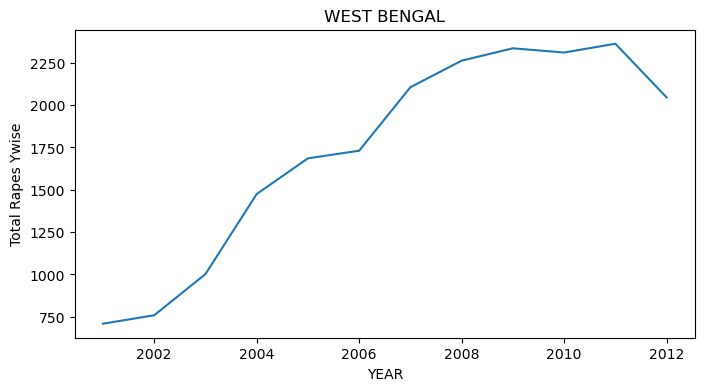

In [67]:
for i in state_ut:
    fig, ax = plt.subplots(1,1, figsize=(8, 4))
    temp_df = rapes_ywise[rapes_ywise['STATE/UT']==i]
    temp_df1 = temp_df.groupby(['STATE/UT','YEAR'])['Total Rapes Ywise'].sum().sort_values(ascending=False).reset_index(name ='Total Rapes Ywise')
    sns.lineplot(x='YEAR',y='Total Rapes Ywise',data=temp_df1)

    plt.title(i)

In [112]:
# Using slightly modified Data
df = pd.read_csv('District_wise_crimes_modified.csv')
df.head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,MurderRelatedCrimes,RAPE,CUSTODIAL RAPE,OTHER RAPE,RapeRelatedCrimes,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,KidnapRelCrimes,DACOITY,PREPARATION AND ASSEMBLY FOR DACOITY,ROBBERY,BURGLARY,THEFT,AUTO THEFT,OTHER THEFT,TheftCrimes,RIOTS,CRIMINAL BREACH OF TRUST,CHEATING,COUNTERFIETING,ARSON,HURT/GREVIOUS HURT,OtherSeriousCrimes,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CrimesonWomen,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,HIMACHAL PRADESH,BILASPUR,2002,11,15,1,27,9,0,9,18,8,3,5,16,0,0,1,59,56,11,45,172,119,12,7,0,32,74,293,0,36,1,22,0,59,49,705,1217
1,HIMACHAL PRADESH,CHAMBA,2002,15,2,0,17,16,0,16,32,14,10,4,28,0,0,1,127,25,3,22,178,13,5,6,0,8,64,140,2,21,1,12,0,36,44,301,677
2,HIMACHAL PRADESH,G.R.P.,2002,0,0,0,0,0,0,0,0,1,0,1,2,0,0,0,1,1,0,1,3,2,0,0,0,0,1,3,0,0,0,0,0,0,0,2,8
3,HIMACHAL PRADESH,HAMIRPUR,2002,8,6,1,15,3,0,3,6,14,14,0,28,0,0,1,18,28,6,22,75,36,7,11,0,6,194,290,0,17,1,24,0,42,36,440,851
4,HIMACHAL PRADESH,KANGRA,2002,28,22,1,51,14,0,14,28,20,17,3,40,0,0,2,90,86,26,60,264,95,4,30,0,24,287,444,2,50,1,32,0,85,4,1169,1961


In [113]:
df = df[['STATE/UT','YEAR','MurderRelatedCrimes','RapeRelatedCrimes','KidnapRelCrimes','TheftCrimes','CrimesonWomen','OtherSeriousCrimes','OTHER IPC CRIMES','TOTAL IPC CRIMES']]

In [74]:
df['STATE/UT'].unique()

array(['HIMACHAL PRADESH', 'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA',
       'KERALA', 'MADHYA PRADESH', 'MAHARASHTRA', 'MANIPUR', 'MEGHALAYA',
       'MIZORAM', 'NAGALAND', 'ODISHA', 'PUNJAB', 'RAJASTHAN', 'SIKKIM',
       'TAMIL NADU', 'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND',
       'WEST BENGAL', 'A & N ISLANDS', 'CHANDIGARH', 'D & N HAVELI',
       'DAMAN & DIU', 'DELHI UT', 'LAKSHADWEEP', 'PUDUCHERRY',
       'ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM', 'BIHAR',
       'CHHATTISGARH', 'GOA', 'GUJARAT', 'HARYANA'], dtype=object)

In [114]:
df.head()

,STATE/UT,YEAR,MurderRelatedCrimes,RapeRelatedCrimes,KidnapRelCrimes,TheftCrimes,CrimesonWomen,OtherSeriousCrimes,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,HIMACHAL PRADESH,2002,27,18,16,172,59,293,705,1217
1,HIMACHAL PRADESH,2002,17,32,28,178,36,140,301,677
2,HIMACHAL PRADESH,2002,0,0,2,3,0,3,2,8
3,HIMACHAL PRADESH,2002,15,6,28,75,42,290,440,851
4,HIMACHAL PRADESH,2002,51,28,40,264,85,444,1169,1961


In [115]:
crimes_statewise= df.groupby(['STATE/UT','YEAR']).sum().reset_index()
crimes_statewise

,STATE/UT,YEAR,MurderRelatedCrimes,RapeRelatedCrimes,KidnapRelCrimes,TheftCrimes,CrimesonWomen,OtherSeriousCrimes,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,A & N ISLANDS,2002,21,4,4,155,24,125,328,608
1,A & N ISLANDS,2003,26,4,4,185,18,153,318,644
2,A & N ISLANDS,2004,18,20,6,278,14,141,387,748
3,A & N ISLANDS,2006,9,12,10,289,25,121,322,676
4,A & N ISLANDS,2007,35,6,24,328,42,162,337,807
...,...,...,...,...,...,...,...,...,...,...
370,WEST BENGAL,2008,4031,4526,4664,36982,16609,22359,38177,105419
371,WEST BENGAL,2009,5118,4672,5500,36284,18673,26232,38776,113036
372,WEST BENGAL,2010,5139,4622,6690,40939,20939,27236,49096,129616
373,WEST BENGAL,2011,4837,4726,8570,45282,22845,28417,56614,143197


C:\Users\bhanu\AppData\Local\Temp\ipykernel_16324\3735406952.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1, figsize=(8, 4))


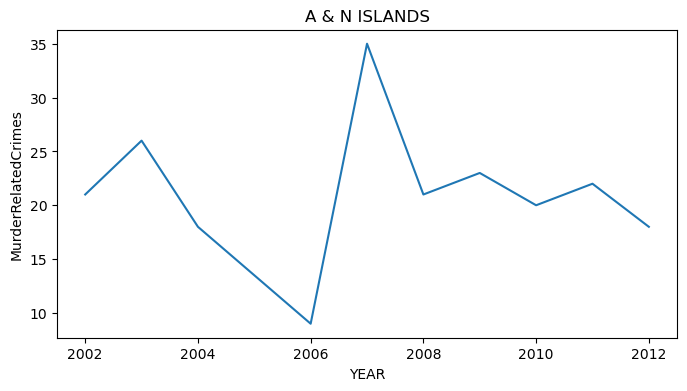

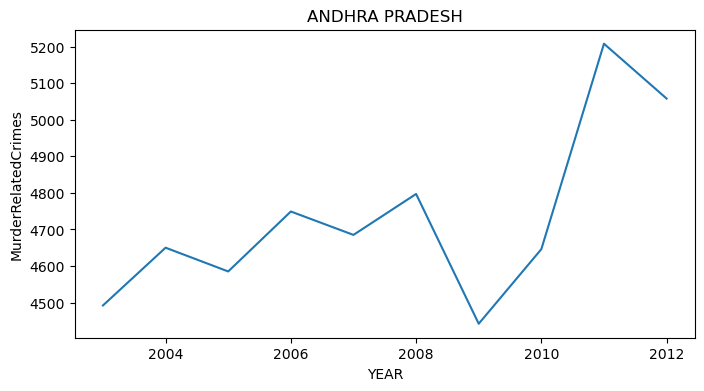

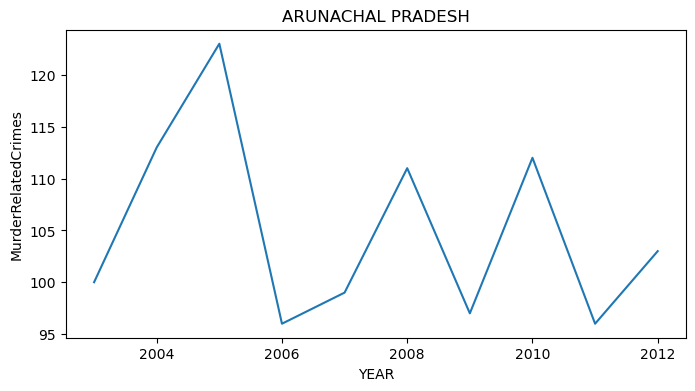

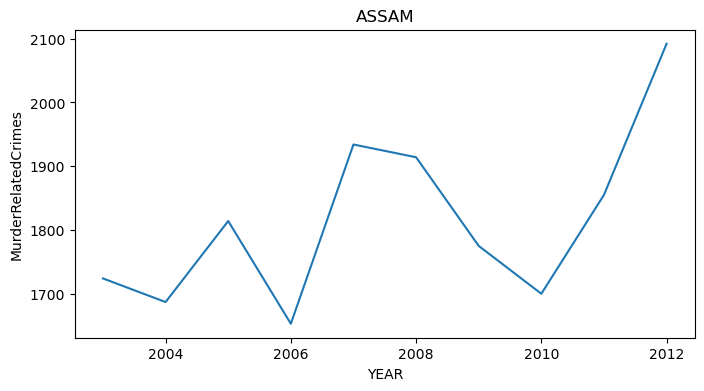

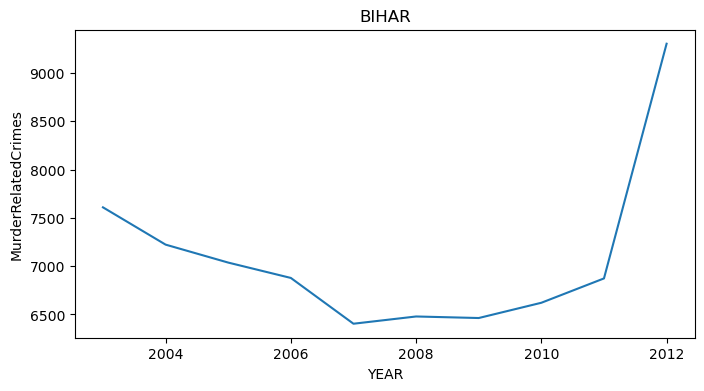

...

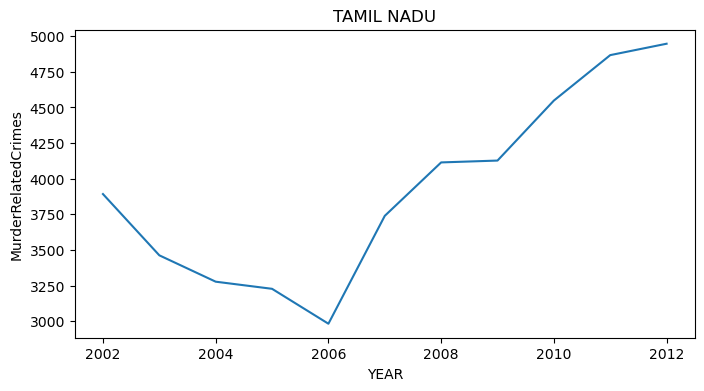

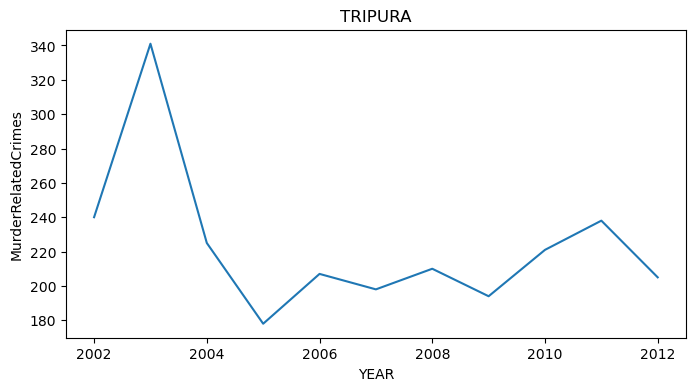

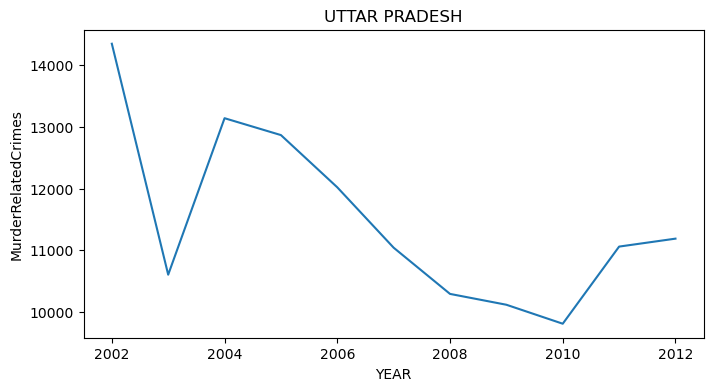

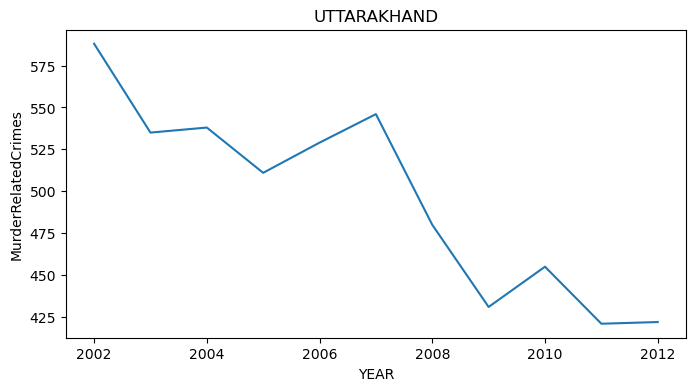

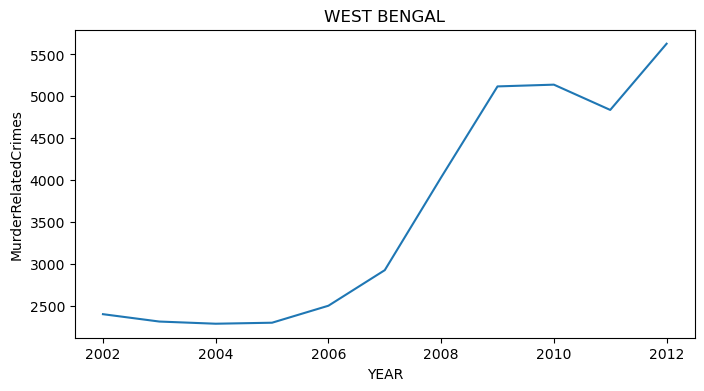

In [92]:
for i in state_ut:
    fig, ax = plt.subplots(1,1, figsize=(8, 4))
    temp_df = crimes_statewise[crimes_statewise['STATE/UT']==i]
    temp_df1 = temp_df.groupby(['STATE/UT','YEAR'])['MurderRelatedCrimes'].sum().reset_index()
    sns.lineplot(x='YEAR',y='MurderRelatedCrimes',data=temp_df1)

    plt.title(i)

C:\Users\bhanu\AppData\Local\Temp\ipykernel_16324\106423882.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1, figsize=(8, 4))


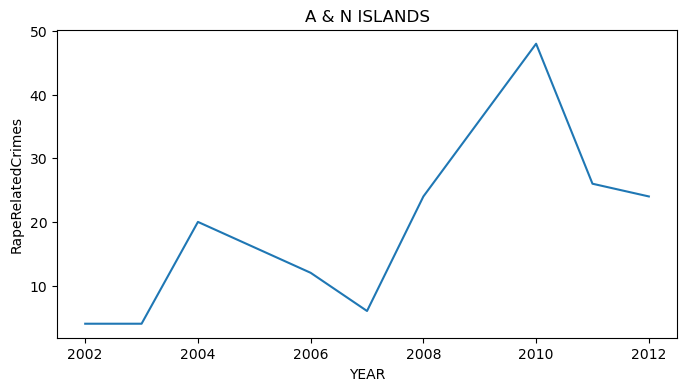

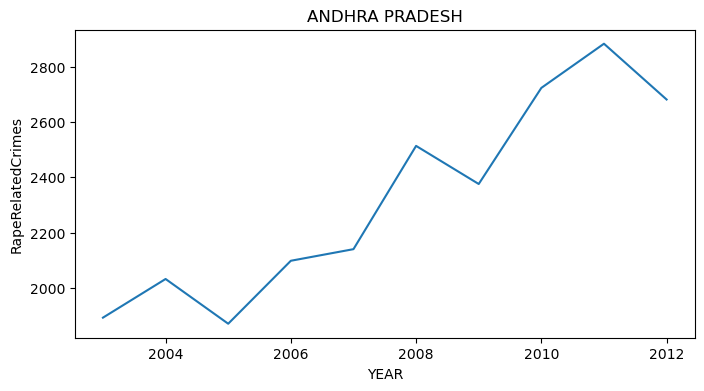

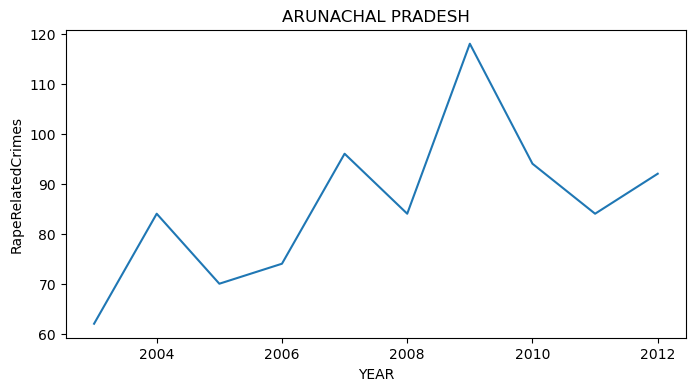

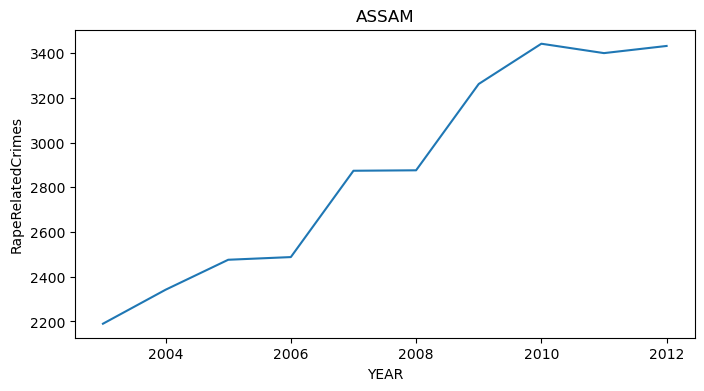

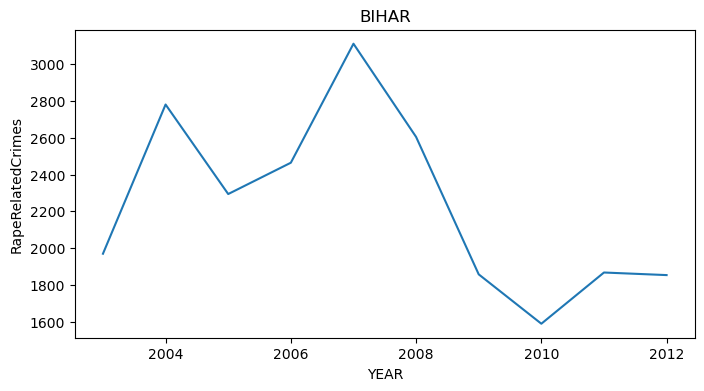

...

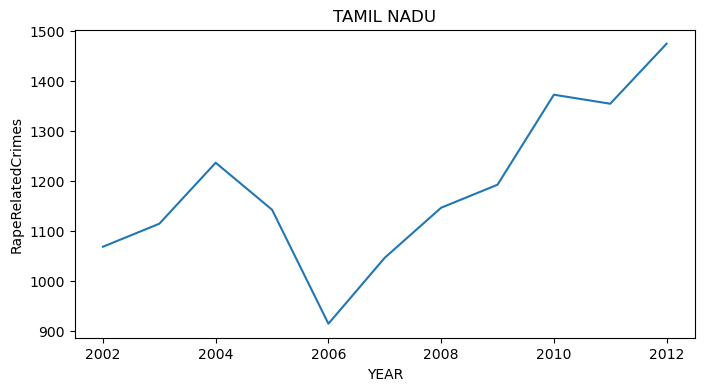

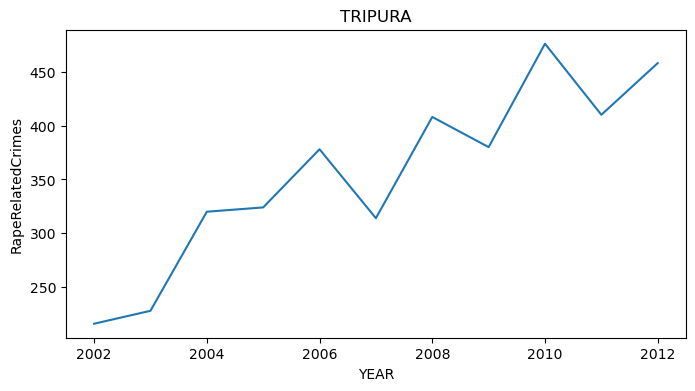

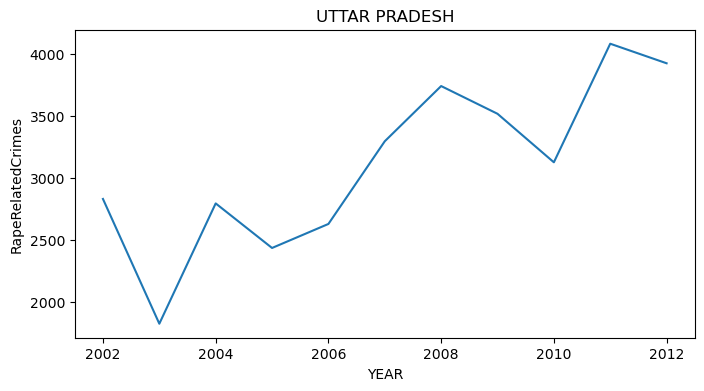

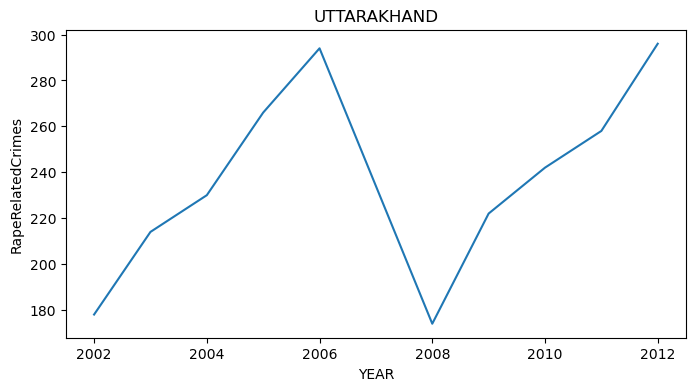

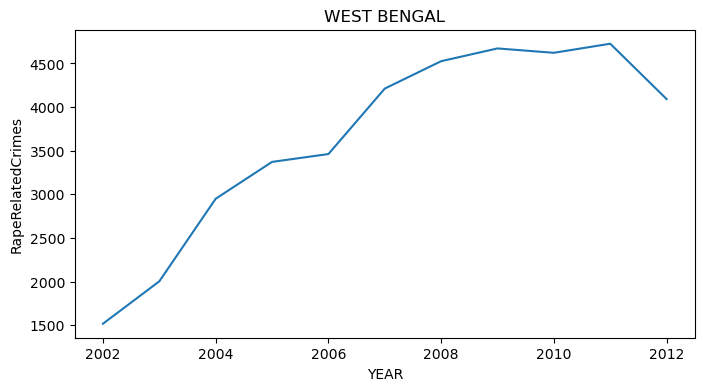

In [93]:
for i in state_ut:
    fig, ax = plt.subplots(1,1, figsize=(8, 4))
    temp_df = crimes_statewise[crimes_statewise['STATE/UT']==i]
    temp_df1 = temp_df.groupby(['STATE/UT','YEAR'])['RapeRelatedCrimes'].sum().reset_index()
    sns.lineplot(x='YEAR',y='RapeRelatedCrimes',data=temp_df1)

    plt.title(i)

C:\Users\bhanu\AppData\Local\Temp\ipykernel_16324\503376149.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1, figsize=(8, 4))


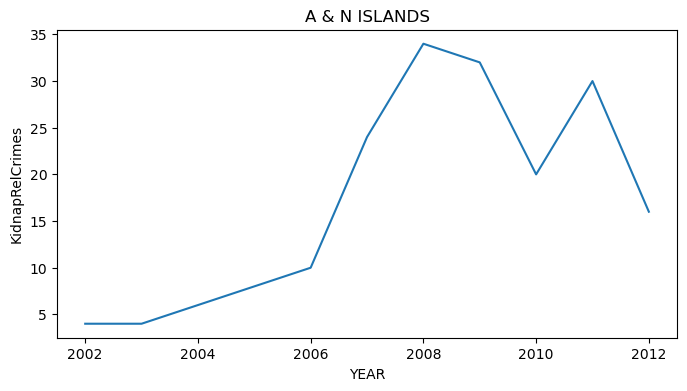

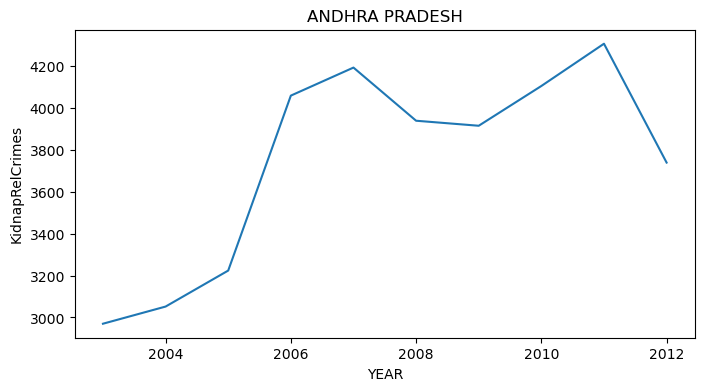

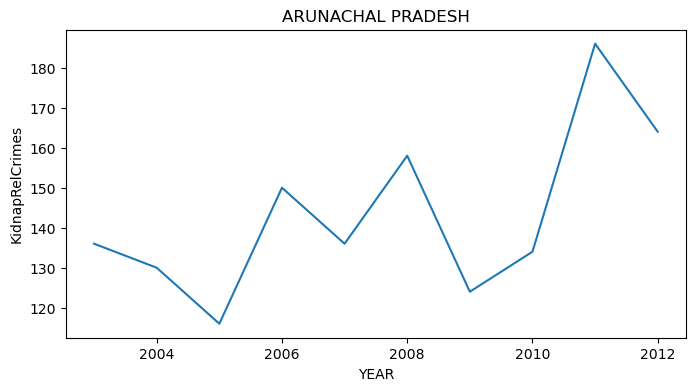

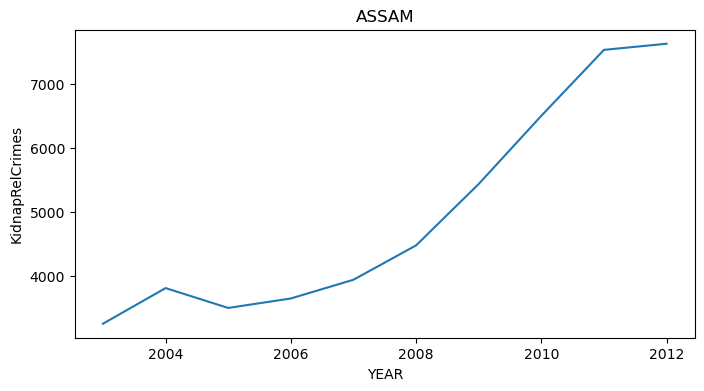

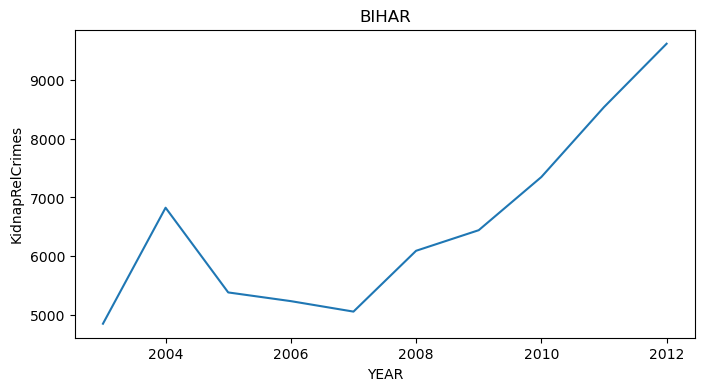

...

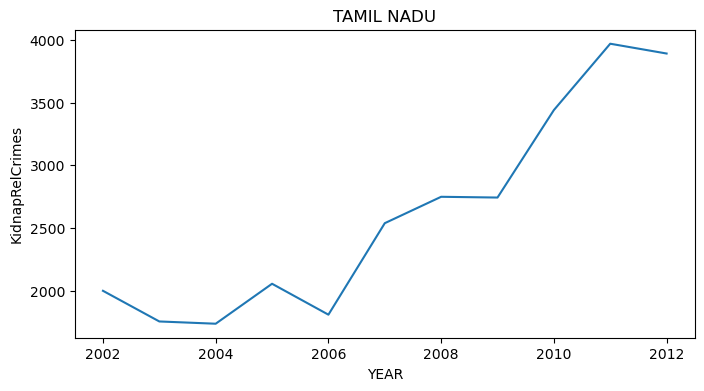

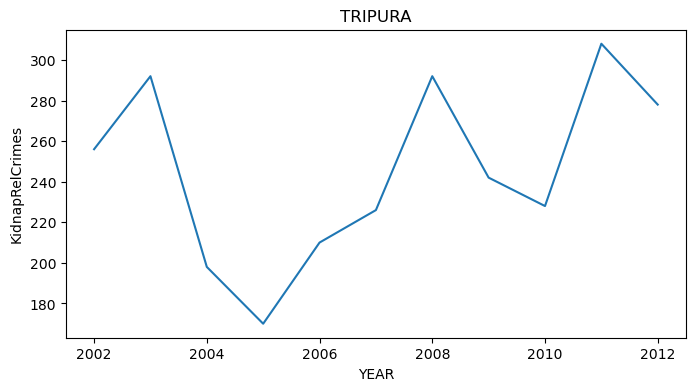

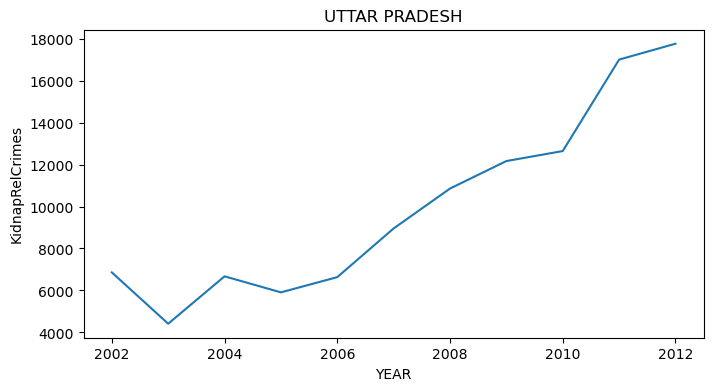

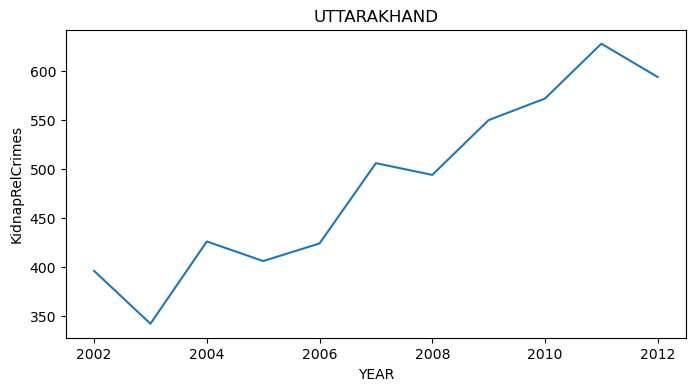

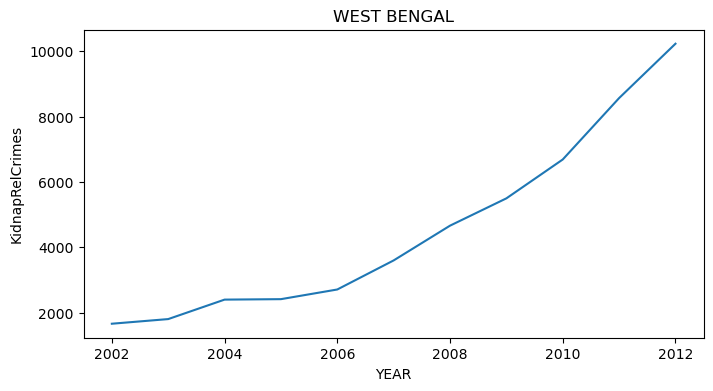

In [94]:
for i in state_ut:
    fig, ax = plt.subplots(1,1, figsize=(8, 4))
    temp_df = crimes_statewise[crimes_statewise['STATE/UT']==i]
    temp_df1 = temp_df.groupby(['STATE/UT','YEAR'])['KidnapRelCrimes'].sum().reset_index()
    sns.lineplot(x='YEAR',y='KidnapRelCrimes',data=temp_df1)

    plt.title(i)

C:\Users\bhanu\AppData\Local\Temp\ipykernel_16324\743045204.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1, figsize=(8, 4))


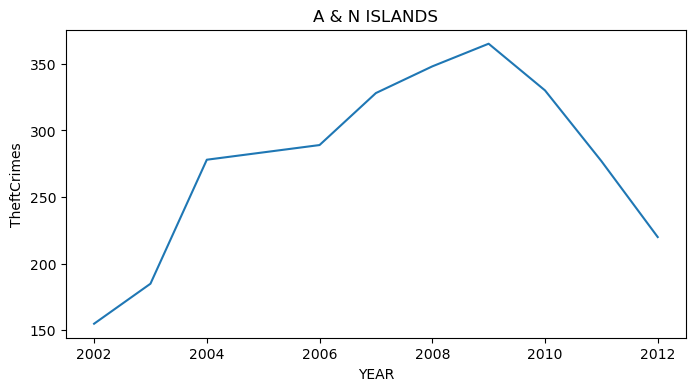

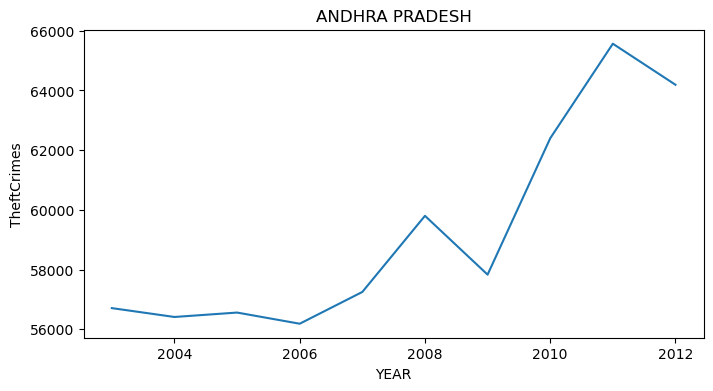

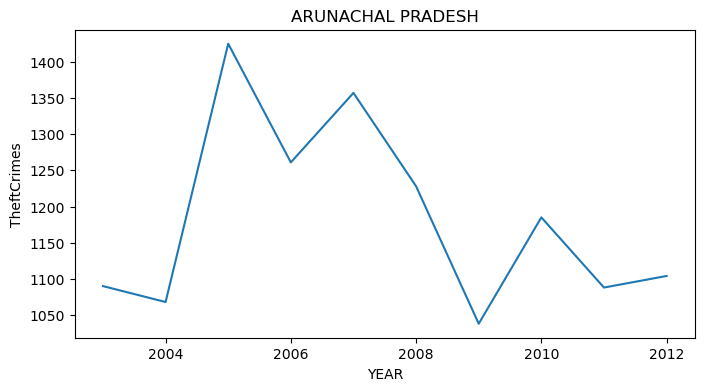

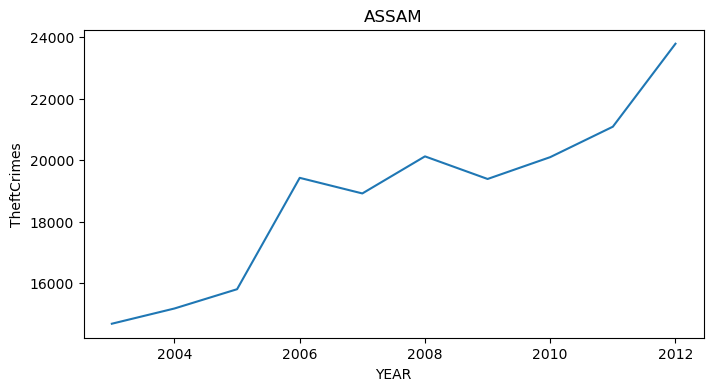

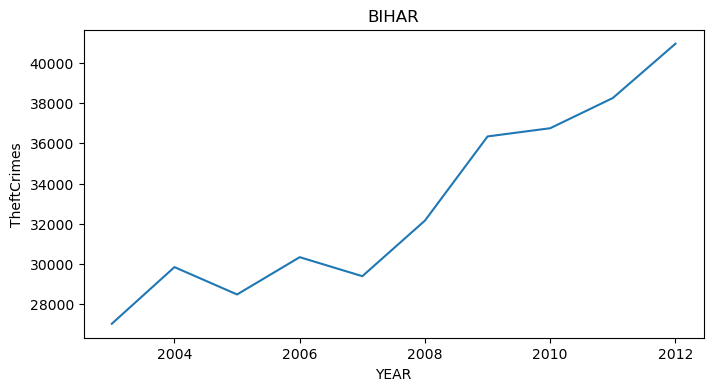

...

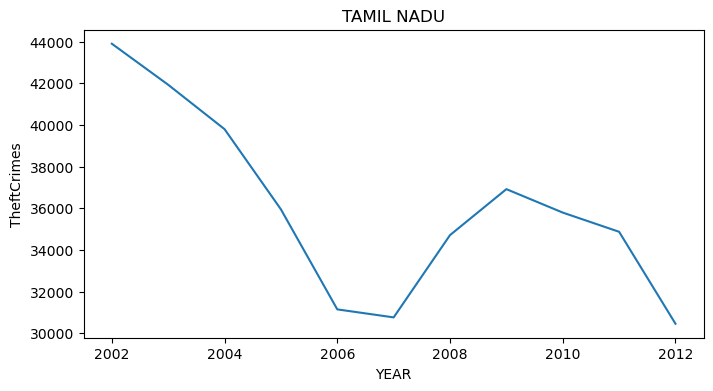

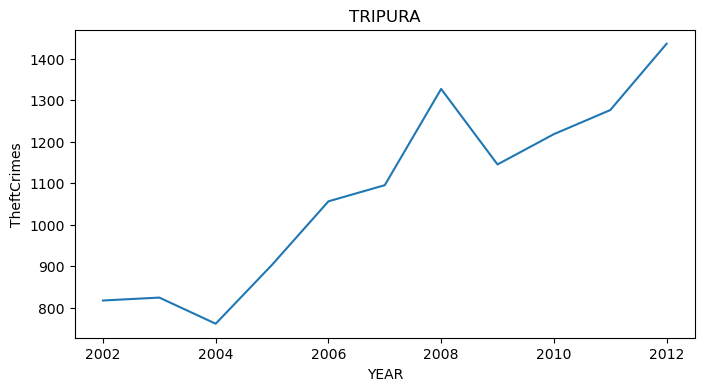

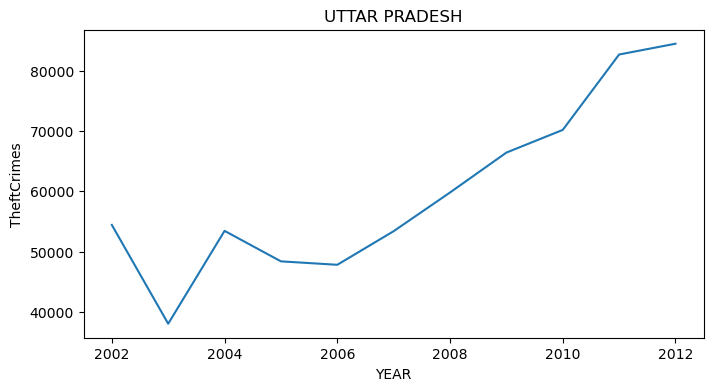

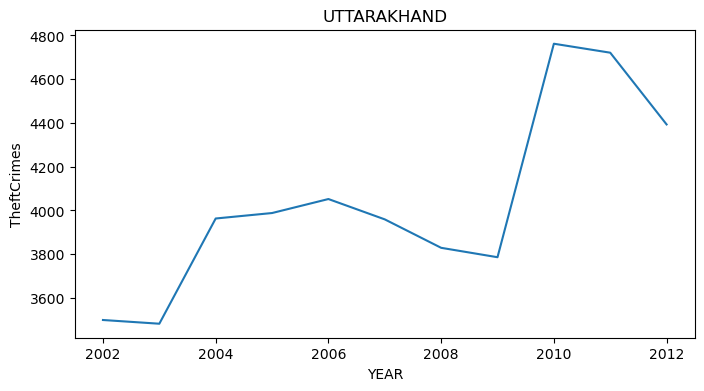

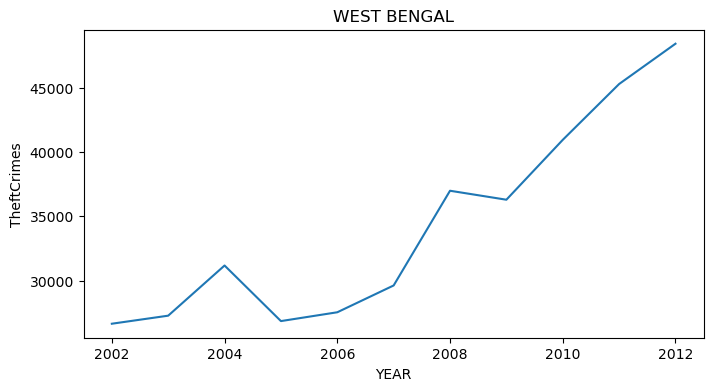

In [95]:
for i in state_ut:
    fig, ax = plt.subplots(1,1, figsize=(8, 4))
    temp_df = crimes_statewise[crimes_statewise['STATE/UT']==i]
    temp_df1 = temp_df.groupby(['STATE/UT','YEAR'])['TheftCrimes'].sum().reset_index()
    sns.lineplot(x='YEAR',y='TheftCrimes',data=temp_df1)

    plt.title(i)

C:\Users\bhanu\AppData\Local\Temp\ipykernel_16324\1359024351.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1, figsize=(8, 4))


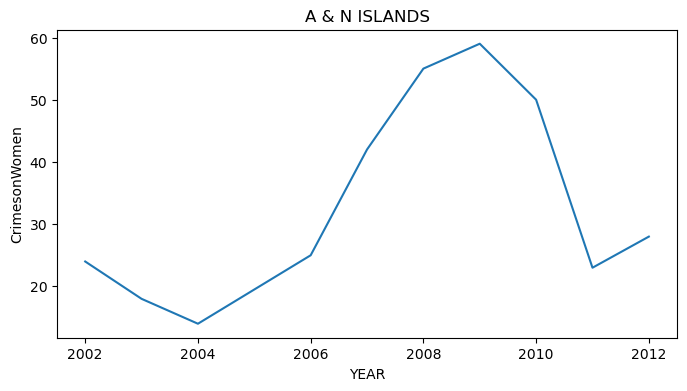

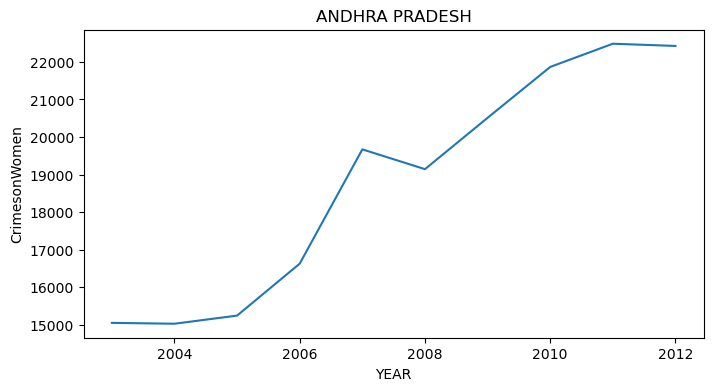

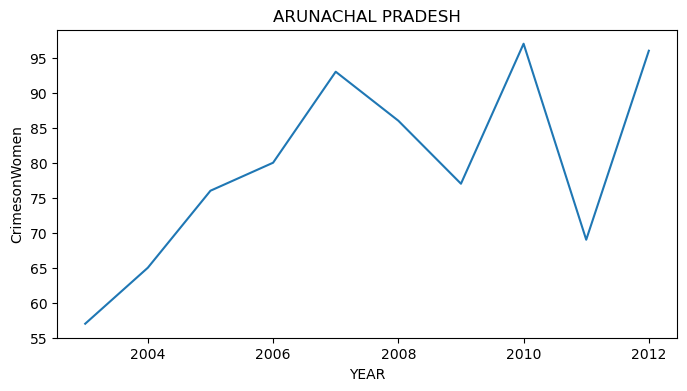

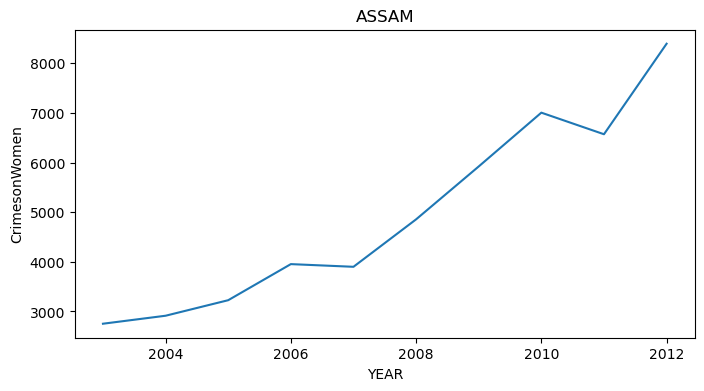

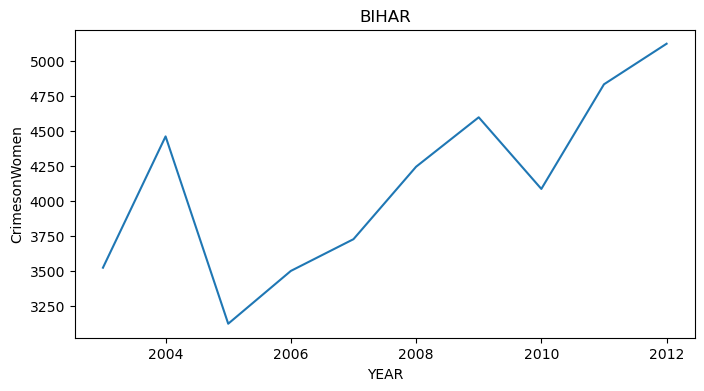

...

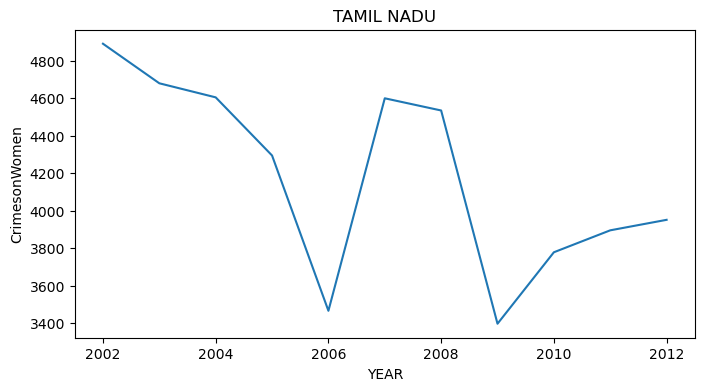

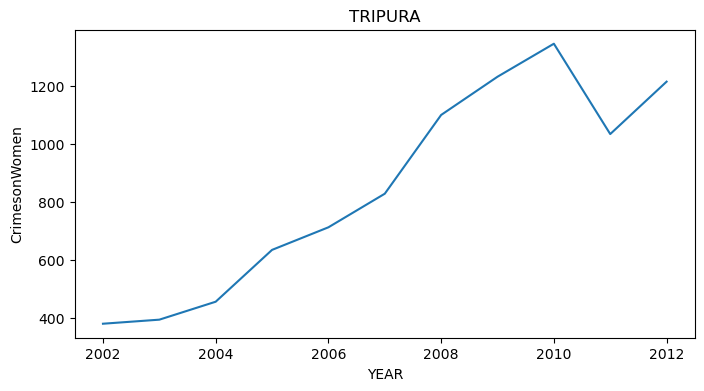

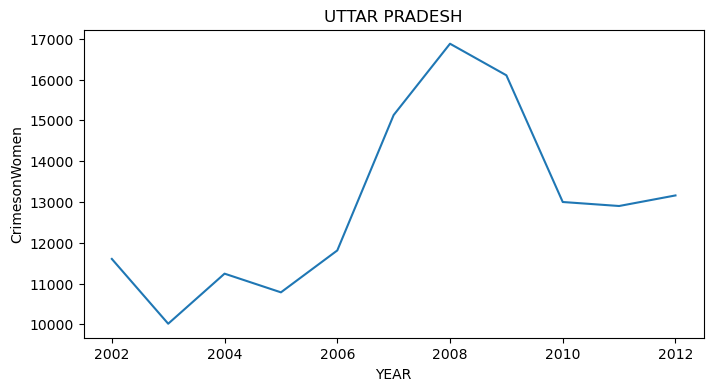

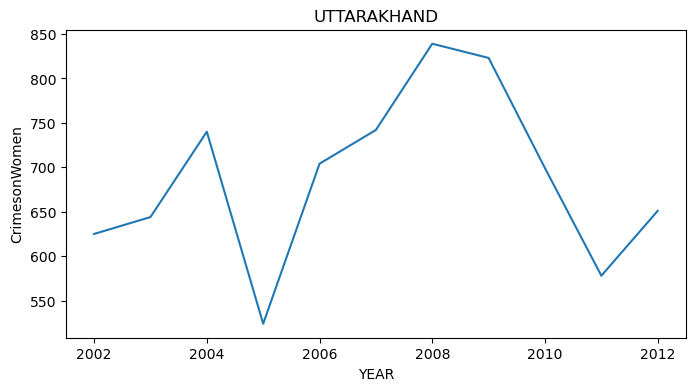

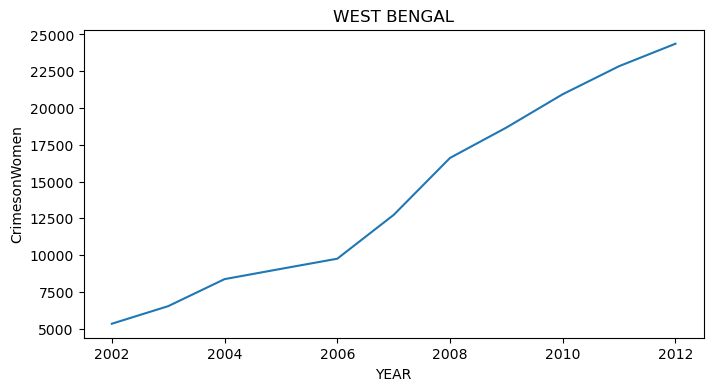

In [96]:
for i in state_ut:
    fig, ax = plt.subplots(1,1, figsize=(8, 4))
    temp_df = crimes_statewise[crimes_statewise['STATE/UT']==i]
    temp_df1 = temp_df.groupby(['STATE/UT','YEAR'])['CrimesonWomen'].sum().reset_index()
    sns.lineplot(x='YEAR',y='CrimesonWomen',data=temp_df1)

    plt.title(i)

In [116]:
area_df = pd.read_csv('Area.csv') 
area_df.sample(2)

,Sno,State,Area,Region
31,32 (UT4),Delhi,1484,Northern
22,23 (S21),Kerala,38863,Southern


In [117]:
area_df['State'] = area_df['State'].str.upper()

In [118]:
area_df.head()

,Sno,State,Area,Region
0,1 (S1),RAJASTHAN,342239,Western
1,2 (S2),MADHYA PRADESH,308245,Central
2,3 (S3),MAHARASHTRA,307713,Western
3,4 (S4),UTTAR PRADESH,240928,Northern
4,5 (S5),GUJARAT,196024,Western


In [119]:
area_df.rename(columns = {'State':'STATE/UT'}, inplace = True)

In [122]:
area_df.drop('Sno',axis=1,inplace=True)

In [123]:
area_df

,STATE/UT,Area,Region
0,RAJASTHAN,342239,Western
1,MADHYA PRADESH,308245,Central
2,MAHARASHTRA,307713,Western
3,UTTAR PRADESH,240928,Northern
4,GUJARAT,196024,Western
5,KARNATAKA,191792,Southern
6,LADAKH,174975,Northern
7,ANDHRA PRADESH,162986,Southern
8,ODISHA,155814,Eastern
9,CHHATTISGARH,135707,Central


In [131]:
df['STATE/UT'].unique()

array(['HIMACHAL PRADESH', 'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA',
       'KERALA', 'MADHYA PRADESH', 'MAHARASHTRA', 'MANIPUR', 'MEGHALAYA',
       'MIZORAM', 'NAGALAND', 'ODISHA', 'PUNJAB', 'RAJASTHAN', 'SIKKIM',
       'TAMIL NADU', 'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND',
       'WEST BENGAL', 'A & N ISLANDS', 'CHANDIGARH', 'D & N HAVELI',
       'DAMAN & DIU', 'DELHI UT', 'LAKSHADWEEP', 'PUDUCHERRY',
       'ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM', 'BIHAR',
       'CHHATTISGARH', 'GOA', 'GUJARAT', 'HARYANA'], dtype=object)

In [130]:
area_df['STATE/UT'].unique()

array(['RAJASTHAN', 'MADHYA PRADESH', 'MAHARASHTRA', 'UTTAR PRADESH',
       'GUJARAT', 'KARNATAKA', 'LADAKH', 'ANDHRA PRADESH', 'ODISHA',
       'CHHATTISGARH', 'TAMILNADU', 'TELANGANA', 'BIHAR', 'WEST BENGAL',
       'ARUNACHAL PRADESH', 'JHARKHAND', 'ASSAM', 'JAMMU AND KASHMIR',
       'HIMACHAL PRADESH', 'UTTARAKHAND', 'PUNJAB', 'HARYANA', 'KERALA',
       'MEGHALAYA', 'MANIPUR', 'MIZORAM', 'NAGALAND', 'TRIPURA',
       'ANDAMAN AND NICOBAR ISLANDS', 'SIKKIM', 'GOA', 'DELHI',
       'DADRA AND NAGAR HAVELI AND DAMAN AND DIU', 'PUDUCHERRY',
       'CHANDIGARH', 'LAKSHADWEEP'], dtype=object)

In [135]:
area_df.replace({'TAMILNADU':'TAMIL NADU','DELHI':'DELHI UT','DADRA AND NAGAR HAVELI AND DAMAN AND DIU':'DAMAN & DIU'},inplace=True)

In [137]:
df = df.merge(area_df,on=[ 'STATE/UT' ], how='left' )

In [139]:
df.dropna(inplace=True)

In [140]:
df.sample(2)

,STATE/UT,YEAR,MurderRelatedCrimes,RapeRelatedCrimes,KidnapRelCrimes,TheftCrimes,CrimesonWomen,OtherSeriousCrimes,OTHER IPC CRIMES,TOTAL IPC CRIMES,Area,Region
5017,KARNATAKA,2009,146,38,46,1464,177,1065,2636,4945,191792.0,Southern
1220,ANDHRA PRADESH,2004,61,28,16,510,240,682,1145,2464,162986.0,Southern


In [144]:
lit = pd.read_csv('Literacy.csv')
pop = pd.read_csv('Population.csv')

In [145]:
lit.head()

,STATE/UT,State,Literacy,Male,Female
0,KERALA,KERALA,94.00,96.11,92.07
1,LAKSHADWEEP,Lakshadweep,91.85,95.56,87.95
2,MIZORAM,Mizoram,91.33,93.35,89.27
3,GOA,Goa,88.70,92.65,84.66
4,TRIPURA,Tripura,87.22,91.53,82.73


In [146]:
pop.head()

,SNO,State,STATE/UT,Population,Ruralpop,urbanpop
0,1,Uttar Pradesh,UTTAR PRADESH,199812341,155317278,44495063
1,2,Maharashtra,MAHARASHTRA,112374333,61556074,50818259
2,3,Bihar,BIHAR,104099452,92341436,11758016
3,4,West Bengal,WEST BENGAL,91276115,62183113,29093002
4,5,Madhya Pradesh,MADHYA PRADESH,72626809,52557404,20069405


In [147]:
lit.drop(columns=['State'],inplace=True)

In [148]:
pop.drop(columns=['State','SNO'],inplace=True)

In [149]:
lit.sample(2)

,STATE/UT,Literacy,Male,Female
12,SIKKIM,81.42,86.55,75.61
26,MADHYA PRADESH,69.32,78.73,59.24


In [150]:
pop.sample(2)

,STATE/UT,Population,Ruralpop,urbanpop
8,GUJARAT,60439692,34694609,25745083
13,ASSAM,31205576,26807034,4398542


In [152]:
df = df.merge(lit,on=[ 'STATE/UT' ], how='left' )

In [153]:
df = df.merge(pop,on=[ 'STATE/UT' ], how='left' )

In [154]:
df.head(2)

,STATE/UT,YEAR,MurderRelatedCrimes,RapeRelatedCrimes,KidnapRelCrimes,TheftCrimes,CrimesonWomen,OtherSeriousCrimes,OTHER IPC CRIMES,TOTAL IPC CRIMES,Area,Region,Literacy,Male,Female,Population,Ruralpop,urbanpop
0,HIMACHAL PRADESH,2002,27,18,16,172,59,293,705,1217,55483.0,Northern,82.8,89.53,75.93,6864602,6176050.0,688552.0
1,HIMACHAL PRADESH,2002,17,32,28,178,36,140,301,677,55483.0,Northern,82.8,89.53,75.93,6864602,6176050.0,688552.0


In [155]:
df.to_csv('final.csv')